## **Notebook EC#13**
## Simple Recurrent Neural Network, Linear Predictor, MLP and LSTM for multi-step time series prediction.<BR>

**Professor:** Fernando J. Von Zuben <br>
**Aluno(a):** Túlio queiroz de Paula

In [1]:
# Loading all the relevant libraries
from pandas import read_csv
from pandas import DataFrame
import numpy as np
import pandas as pd
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN, LSTM, GRU
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import math
import matplotlib.pyplot as plt

2024-12-04 20:40:01.076748: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-04 20:40:01.079981: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-04 20:40:01.090354: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-04 20:40:01.107452: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-04 20:40:01.112354: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-04 20:40:01.124658: I tensorflow/core/platform/cpu_feature_gu

#### **Please, upload the datasets [monthly_sunspot.csv] and [unemployment_rate.csv] before executing the code. The datasets are provided together with this code. The dataset [unemployment rate] is available at [this link](https://fred.stlouisfed.org/series/UNRATE). The dataset [monthly_sunspot.csv] is available at [this link](https://github.com/jbrownlee/Datasets/blob/master/monthly-sunspots.csv).**

In [2]:
# Structuring the dataset from a single time series, scaling and spliting into training / testing
def get_train_test(dataset, split_percent, time_steps, horizon):
    df = read_csv(dataset, usecols=[1], engine='python')
    data = np.array(df.values.astype('float32'))
    scaler = MinMaxScaler(feature_range=(0, 1))
    # There is a kind of data leakage in the next command
    data = scaler.fit_transform(data).flatten()
    n = len(data)
    df = DataFrame()
    for i in range(0,time_steps):
        df['t-' + str(time_steps-i-1)] = [data[j] for j in range(i, (len(data)-horizon-time_steps+i+1))]
    for i in range(1,horizon+1):
        df['t+' + str(i)] = [data[j] for j in range(time_steps+i-1, (len(data)-horizon+i))]
    print(df)
    df1 = df.copy()
    for i in range(1,horizon+1):
        df1 = df1.drop(['t+' + str(i)], axis = 1)
    dataX = np.array(df1) #separacao de dados de time_steps
    df2 = df['t+1']
    for i in range(2,horizon+1):
        df2 = pd.concat([df2, df['t+' + str(i)]], axis=1)
    datay = np.array(df2) #separacao de dados de horizon
    # Point for splitting data into train and test
    split = int(n*split_percent)
    X = dataX[range(split),:]
    y = datay[range(split)]
    Xt = dataX[split:,:]
    yt = datay[split:]
    return X, y, Xt, yt

time_steps = 11
horizon = 3
# Here you will decide which dataset to consider.
# X, y, Xt, yt = get_train_test('unemployment_rate.csv', 0.8, time_steps, horizon)
X, y, Xt, yt = get_train_test('data/unemployment_rate.csv', 0.8, time_steps, horizon)

         t-10       t-9       t-8       t-7       t-6       t-5       t-4  \
0    0.073171  0.105691  0.121951  0.113821  0.081301  0.089431  0.089431   
1    0.105691  0.121951  0.113821  0.081301  0.089431  0.089431  0.113821   
2    0.121951  0.113821  0.081301  0.089431  0.089431  0.113821  0.105691   
3    0.113821  0.081301  0.089431  0.089431  0.113821  0.105691  0.097561   
4    0.081301  0.089431  0.089431  0.113821  0.105691  0.097561  0.105691   
..        ...       ...       ...       ...       ...       ...       ...   
904  0.097561  0.089431  0.081301  0.105691  0.105691  0.105691  0.097561   
905  0.089431  0.081301  0.105691  0.105691  0.105691  0.097561  0.097561   
906  0.081301  0.105691  0.105691  0.105691  0.097561  0.097561  0.097561   
907  0.105691  0.105691  0.105691  0.097561  0.097561  0.097561  0.113821   
908  0.105691  0.105691  0.097561  0.097561  0.097561  0.113821  0.105691   

          t-3       t-2       t-1       t-0       t+1       t+2       t+3  

#### **Please, to switch between the two datasets, comment the appropriate command at the end of the code cell above and uncomment the other.**

In [3]:
print(X.shape)
print(y.shape)

(737, 11)
(737, 3)


## **Implementing the simple recurrent neural network**

In [4]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def create_RNN(hidden_units, dense_units, input_shape, activation):
        model = Sequential()
        model.add(SimpleRNN(hidden_units, activation=activation[0], input_shape=input_shape))
        model.add(Dense(units=dense_units, activation=activation[1]))
        model.compile(loss='mean_squared_error', optimizer='adam')
        return model

def RNN_predictor (X, y, time_steps):
    model = create_RNN(hidden_units=30, dense_units=horizon, input_shape=(time_steps,1), activation=['tanh', 'tanh'])
    train_predict = model.fit(X, y, epochs=20, batch_size=1, verbose=2)
    return model

RNN_model = RNN_predictor(X, y, time_steps)

Epoch 1/20


/home/tulio-queiroz/Documents/repos/repos-unicamp/ea072/inteligencia-artificial/.venv/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


737/737 - 2s - 2ms/step - loss: 0.0039
Epoch 2/20
737/737 - 1s - 1ms/step - loss: 0.0011
Epoch 3/20
737/737 - 1s - 1ms/step - loss: 9.6536e-04
Epoch 4/20
737/737 - 1s - 1ms/step - loss: 8.6308e-04
Epoch 5/20
737/737 - 1s - 1ms/step - loss: 8.0822e-04
Epoch 6/20
737/737 - 1s - 1ms/step - loss: 7.5662e-04
Epoch 7/20
737/737 - 1s - 1ms/step - loss: 7.2345e-04
Epoch 8/20
737/737 - 1s - 1ms/step - loss: 7.3106e-04
Epoch 9/20
737/737 - 1s - 1ms/step - loss: 7.1189e-04
Epoch 10/20
737/737 - 1s - 1ms/step - loss: 7.1251e-04
Epoch 11/20
737/737 - 1s - 1ms/step - loss: 7.0208e-04
Epoch 12/20
737/737 - 1s - 1ms/step - loss: 7.0022e-04
Epoch 13/20
737/737 - 1s - 1ms/step - loss: 6.9352e-04
Epoch 14/20
737/737 - 1s - 1ms/step - loss: 6.8739e-04
Epoch 15/20
737/737 - 1s - 1ms/step - loss: 6.9559e-04
Epoch 16/20
737/737 - 1s - 1ms/step - loss: 7.0208e-04
Epoch 17/20
737/737 - 1s - 1ms/step - loss: 7.0820e-04
Epoch 18/20
737/737 - 1s - 1ms/step - loss: 7.0761e-04
Epoch 19/20
737/737 - 1s - 1ms/step - 

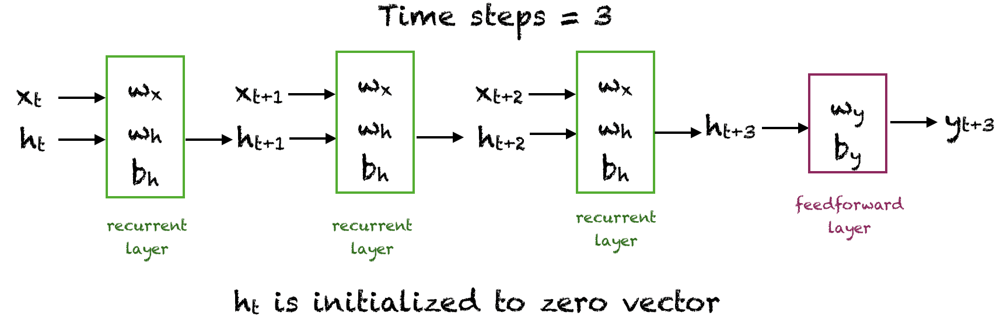

In [5]:
# Configuration of the simple RNN
from IPython.display import Image
Image("RNN_info_flow.png", width = 600, height = 300)

In [6]:
wx = RNN_model.get_weights()[0]
wh = RNN_model.get_weights()[1]
bh = RNN_model.get_weights()[2]
wy = RNN_model.get_weights()[3]
by = RNN_model.get_weights()[4]
print(wx.shape)
print(wh.shape)
print(bh.shape)
print(wy.shape)
print(by.shape)

(1, 30)
(30, 30)
(30,)
(30, 3)
(3,)


## **Implementing a linear predictor**

In [7]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def linear_predictor(X,y):
    model = LinearRegression()
    train_predict = model.fit(X, y)
    print(model.coef_)
    print(model.intercept_)

    return model

linear_model = linear_predictor(X,y)

[[ 0.11635164 -0.11914894 -0.01942729  0.05489923 -0.03783269 -0.1263828
   0.0364702  -0.08040635 -0.07350127  0.23933175  0.9943883 ]
 [ 0.07123443  0.04430836 -0.1285803   0.02992226  0.01131357 -0.16094038
  -0.09467939 -0.04424857 -0.15307982  0.16558304  1.2274771 ]
 [ 0.20399238 -0.12932649  0.00457353 -0.06249118 -0.01781941 -0.14087321
  -0.10628925 -0.18631862 -0.14209121  0.14068489  1.3865654 ]]
[0.00427848 0.00879061 0.01370864]


## **Implementing the multilayer perceptron neural network (MLP)**

In [8]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def MLP_predictor():
    model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(80, activation=tf.nn.tanh),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(horizon, activation='linear')
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')
    train_predict = model.fit(X, y, epochs=100)
    model.summary()

    return model

MLP_model = MLP_predictor()

Epoch 1/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0885 
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0229
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0175
Epoch 4/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0141
Epoch 5/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0105
Epoch 6/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0101
Epoch 7/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0079
Epoch 8/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0064
Epoch 9/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0050
Epoch 10/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0050
Epoch 11/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0043
Epoch 12/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0039
Epoch 13/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0041
Epoch 14/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0032
Epoch 15/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0011
Epoch 81/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0012   
Epoch 82/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0012   
Epoch 83/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0012   
Epoch 84/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0013
Epoch 85/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0011
Epoch 86/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0011   
Epoch 87/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 8.2657e-04
Epoch 88/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 9.9355e-04
Epoch 89/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0010
Epoch 90/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 9.1450e-04
Epoch 91/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0012
Epoch 92/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0010   
Epoch 93/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0011   
Epoch 94/100
24/2

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 80)             │           960 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 80)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │           243 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,611 (14.11 KB)

 Trainable params: 1,203 (4.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,408 (9.41 KB)

## **Implementing the long short-term memory network (LSTM)**

In [9]:
def LSTM_predictor(X, y, time_steps):
    X1 = X.reshape(X.shape[0],time_steps,1)
    model=Sequential()
    model.add(LSTM(25,input_shape=(time_steps,1)))
    model.add(Dense(horizon,activation='linear'))
    model.compile(loss='mean_squared_error',optimizer='adam')

    train_predict = model.fit(X1,y,epochs=200,verbose=2)

    return model

LSTM_model = LSTM_predictor(X, y, time_steps)
print(LSTM_model.summary())

Epoch 1/200


/home/tulio-queiroz/Documents/repos/repos-unicamp/ea072/inteligencia-artificial/.venv/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 - 1s - 42ms/step - loss: 0.0253
Epoch 2/200
24/24 - 0s - 3ms/step - loss: 0.0064
Epoch 3/200
24/24 - 0s - 3ms/step - loss: 0.0044
Epoch 4/200
24/24 - 0s - 3ms/step - loss: 0.0039
Epoch 5/200
24/24 - 0s - 3ms/step - loss: 0.0036
Epoch 6/200
24/24 - 0s - 3ms/step - loss: 0.0034
Epoch 7/200
24/24 - 0s - 3ms/step - loss: 0.0033
Epoch 8/200
24/24 - 0s - 3ms/step - loss: 0.0032
Epoch 9/200
24/24 - 0s - 3ms/step - loss: 0.0031
Epoch 10/200
24/24 - 0s - 3ms/step - loss: 0.0030
Epoch 11/200
24/24 - 0s - 3ms/step - loss: 0.0029
Epoch 12/200
24/24 - 0s - 3ms/step - loss: 0.0028
Epoch 13/200
24/24 - 0s - 3ms/step - loss: 0.0026
Epoch 14/200
24/24 - 0s - 3ms/step - loss: 0.0026
Epoch 15/200
24/24 - 0s - 3ms/step - loss: 0.0024
Epoch 16/200
24/24 - 0s - 3ms/step - loss: 0.0023
Epoch 17/200
24/24 - 0s - 3ms/step - loss: 0.0020
Epoch 18/200
24/24 - 0s - 3ms/step - loss: 0.0019
Epoch 19/200
24/24 - 0s - 3ms/step - loss: 0.0017
Epoch 20/200
24/24 - 0s - 3ms/step - loss: 0.0017
Epoch 21/200
24/24 -

Epoch 156/200
24/24 - 0s - 3ms/step - loss: 5.8267e-04
Epoch 157/200
24/24 - 0s - 3ms/step - loss: 5.7776e-04
Epoch 158/200
24/24 - 0s - 3ms/step - loss: 5.7659e-04
Epoch 159/200
24/24 - 0s - 3ms/step - loss: 6.0702e-04
Epoch 160/200
24/24 - 0s - 3ms/step - loss: 5.9226e-04
Epoch 161/200
24/24 - 0s - 3ms/step - loss: 6.1512e-04
Epoch 162/200
24/24 - 0s - 3ms/step - loss: 5.8198e-04
Epoch 163/200
24/24 - 0s - 3ms/step - loss: 5.7794e-04
Epoch 164/200
24/24 - 0s - 3ms/step - loss: 5.8119e-04
Epoch 165/200
24/24 - 0s - 3ms/step - loss: 5.7836e-04
Epoch 166/200
24/24 - 0s - 3ms/step - loss: 5.8769e-04
Epoch 167/200
24/24 - 0s - 3ms/step - loss: 6.4315e-04
Epoch 168/200
24/24 - 0s - 3ms/step - loss: 5.9890e-04
Epoch 169/200
24/24 - 0s - 3ms/step - loss: 5.7802e-04
Epoch 170/200
24/24 - 0s - 3ms/step - loss: 5.7864e-04
Epoch 171/200
24/24 - 0s - 3ms/step - loss: 5.9733e-04
Epoch 172/200
24/24 - 0s - 3ms/step - loss: 5.7211e-04
Epoch 173/200
24/24 - 0s - 3ms/step - loss: 5.7676e-04
Epoch 174/

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 25)             │         2,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │            78 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,336 (32.57 KB)

 Trainable params: 2,778 (10.85 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,558 (21.71 KB)

None


In [10]:
def print_error(trainY, testY, train_predict, test_predict,i):
    # Error of predictions
    train_rmse = math.sqrt(mean_squared_error(trainY, train_predict))
    test_rmse = math.sqrt(mean_squared_error(testY, test_predict))
    # Print RMSE
    print('t+%d RMSE train: %.3f RMSE' % (i+1, train_rmse))
    print('t+%d RMSE test: %.3f RMSE' % (i+1, test_rmse))
    return [train_rmse, test_rmse]


def RMSE(train_predict, test_predict):
    rmse = []
    for i in range(horizon):
        if(horizon == 1):
            y1_pred = train_predict
            y1_pred_t = test_predict
            y1 = y
            y1_t = yt
        elif(horizon > 1):
            y1_pred = train_predict[:,i]
            y1_pred_t = test_predict[:,i]
            y1 = y[:,i]
            y1_t = yt[:,i]

    erro = print_error(y1, y1_t, y1_pred, y1_pred_t,i)
    rmse.append(erro)

# Create a DataFrame from the rmse values for each horizon
    df = pd.DataFrame(rmse)
    df.columns = ['train', 'test']
    return df


In [11]:
# Plot the predictions together with the actual values
def plot_result(trainY, testY, train_predict, test_predict,i):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 6), dpi=300)
    plt.plot(range(rows), actual)
    plt.plot(range(rows), predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.legend(['Actual', 'Predictions'])
    plt.xlabel('Time steps')
    plt.ylabel('Actual and Predicted Values')
    plt.title('t+%d Predition (The Red Line Separates The Training And Test Examples)' % (i+1))
    plt.grid(True)

def plot_predict(train_predict, test_predict, y, yt):
    for i in range(horizon):
        if(horizon == 1):
            y1_pred = train_predict
            y1_pred_t = test_predict
            y1 = y
            y1_t = yt
        elif(horizon > 1):
            y1_pred = train_predict[:,i]
            y1_pred_t = test_predict[:,i]
            y1 = y[:,i]
            y1_t = yt[:,i]
            plot_result(y1, y1_t, y1_pred, y1_pred_t,i)


***** RNN MODEL *****
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
t+3 RMSE train: 0.031 RMSE
t+3 RMSE test: 0.111 RMSE


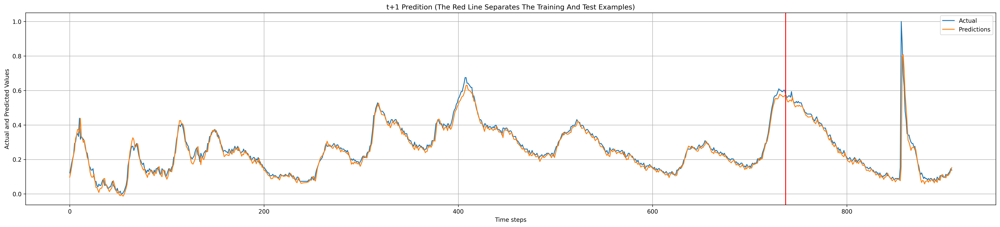

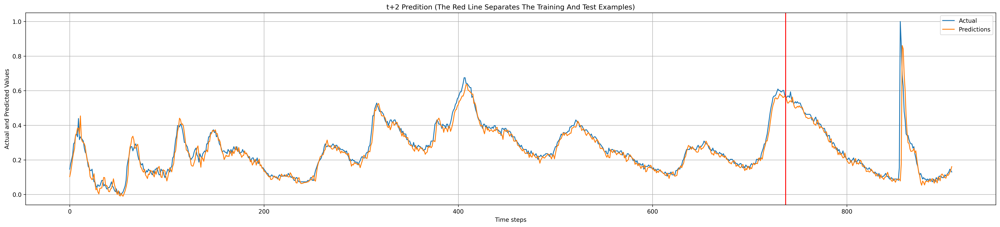

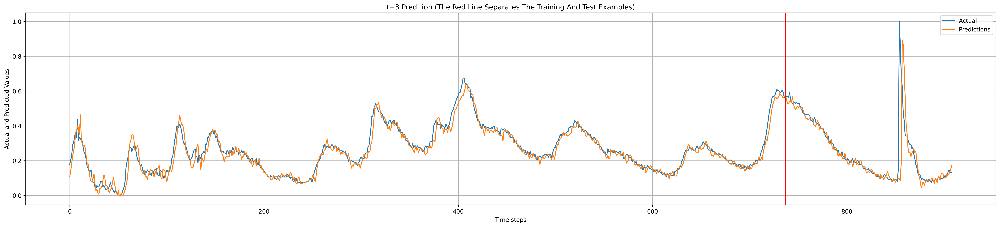

In [29]:
print ('***** RNN MODEL *****')
train_predict = RNN_model.predict(X)
test_predict = RNN_model.predict(Xt)
df1 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** LINEAR MODEL *****
t+3 RMSE train: 0.030 RMSE
t+3 RMSE test: 0.141 RMSE


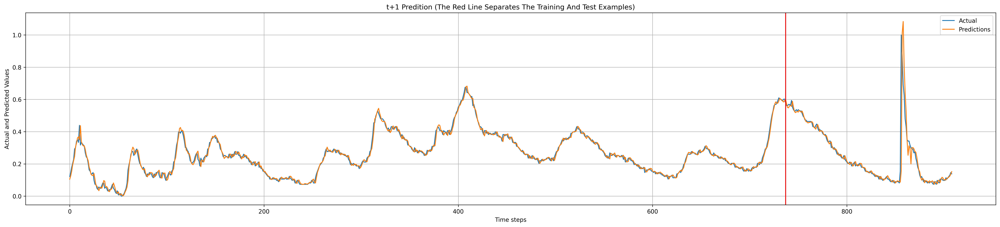

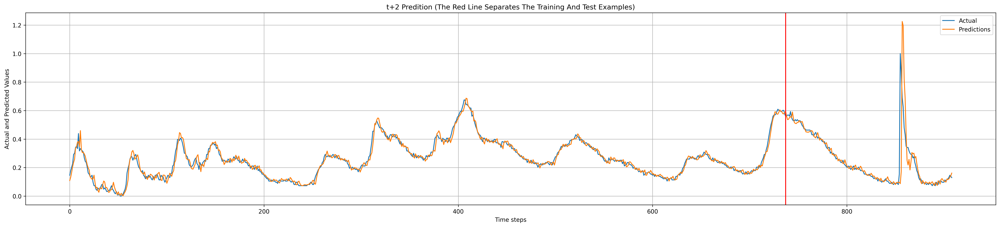

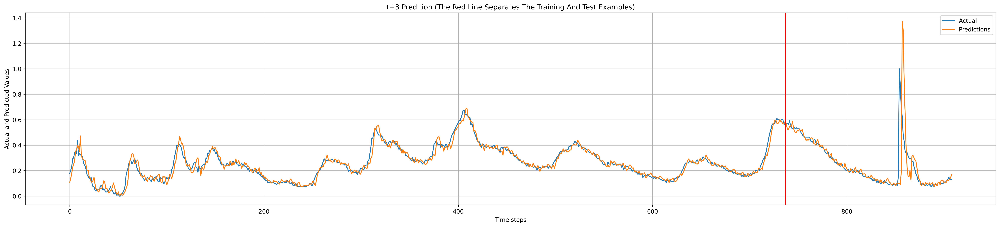

In [13]:
print ('***** LINEAR MODEL *****')
train_predict = linear_model.predict(X)
test_predict = linear_model.predict(Xt)
df2 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** MLP MODEL *****
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step
t+3 RMSE train: 0.031 RMSE
t+3 RMSE test: 0.139 RMSE


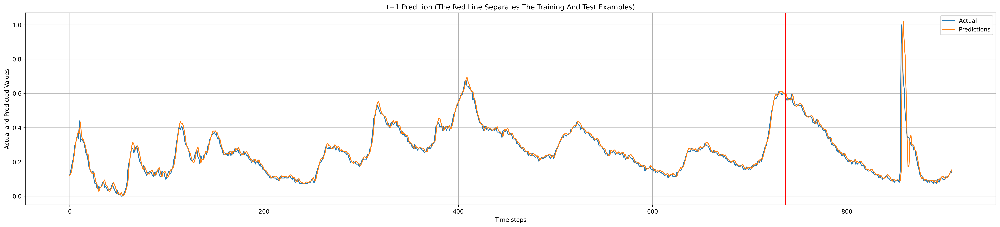

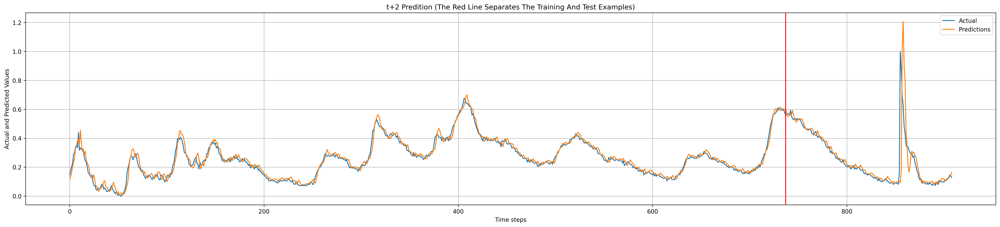

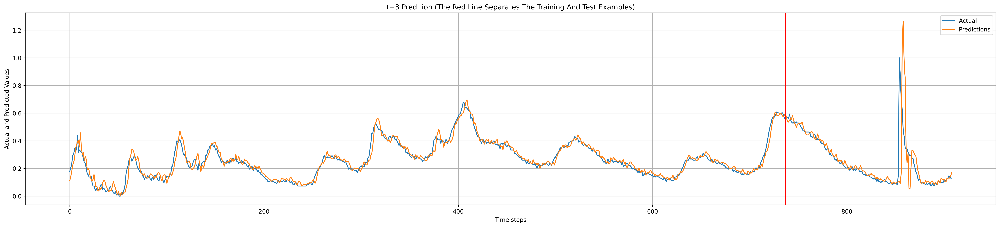

In [14]:
print ('***** MLP MODEL *****')
train_predict = MLP_model.predict(X)
test_predict = MLP_model.predict(Xt)
df3 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** LSTM MODEL *****
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
t+3 RMSE train: 0.030 RMSE
t+3 RMSE test: 0.135 RMSE


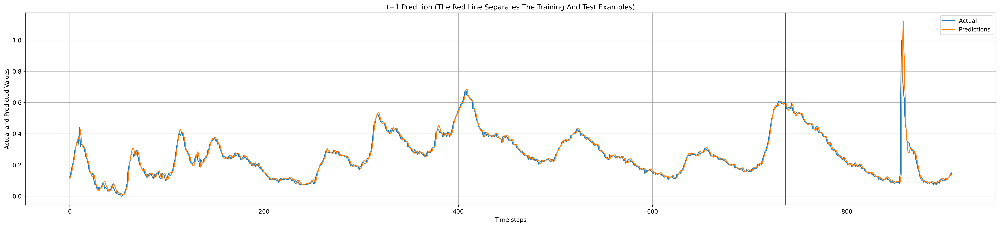

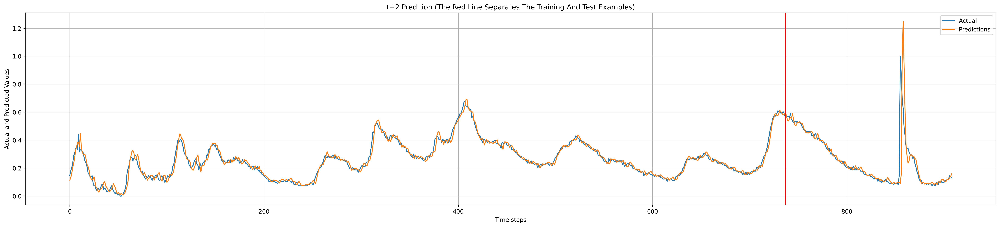

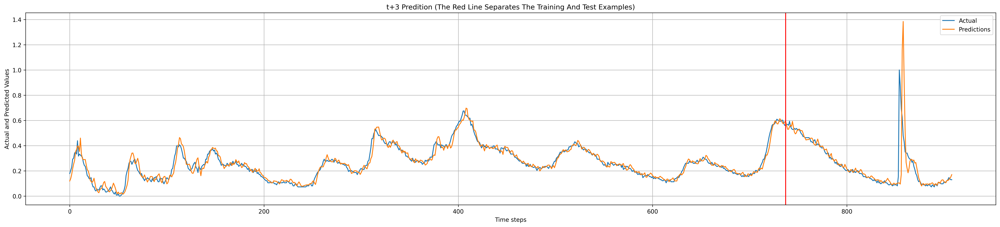

In [15]:
print ('***** LSTM MODEL *****')
train_predict = LSTM_model.predict(X)
test_predict = LSTM_model.predict(Xt)
df4 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

In [16]:
# Plot the prediction error
def plot_result2(trainY, testY, train_predict, test_predict,i):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 6), dpi=300)
    plt.plot(range(rows), actual - predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.xlabel('Time steps')
    plt.ylabel('Actual minus Predicted Values')
    plt.title('t+%d Predition Error (The Red Line Separates The Training And Test Examples)' % (i+1))
    plt.ylim(-0.5, +1.0) # Please, set the interval appropriately, considering all the graphs.
    plt.grid(True)

def plot_error_predict(train_predict, test_predict, y, yt):
    for i in range(horizon):
      if(horizon == 1):
        y1_pred = train_predict
        y1_pred_t = test_predict
        y1 = y
        y1_t = yt
      elif(horizon > 1):
        y1_pred = train_predict[:,i]
        y1_pred_t = test_predict[:,i]
        y1 = y[:,i]
        y1_t = yt[:,i]
      plot_result2(y1, y1_t, y1_pred, y1_pred_t,i)

***** RNN MODEL *****
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


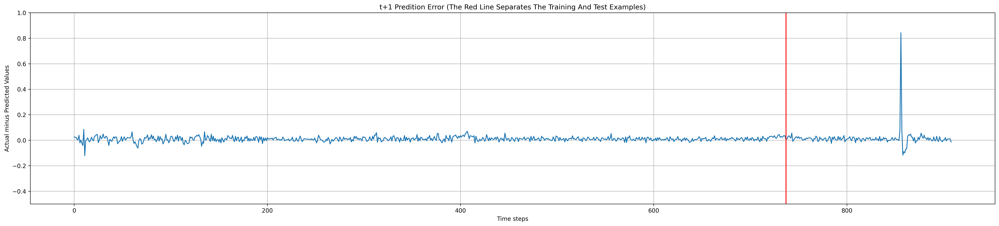

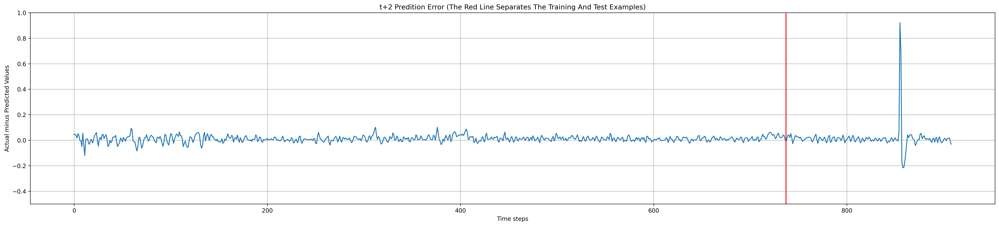

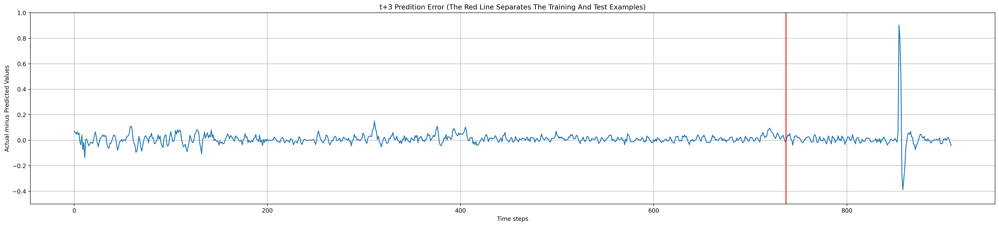

In [17]:
print ('***** RNN MODEL *****')
train_predict = RNN_model.predict(X)
test_predict = RNN_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)


***** LINEAR MODEL *****


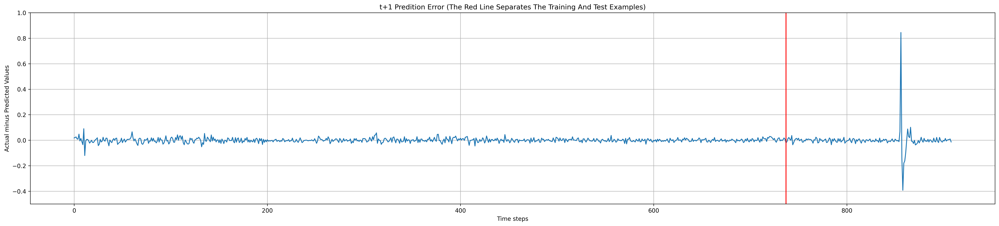

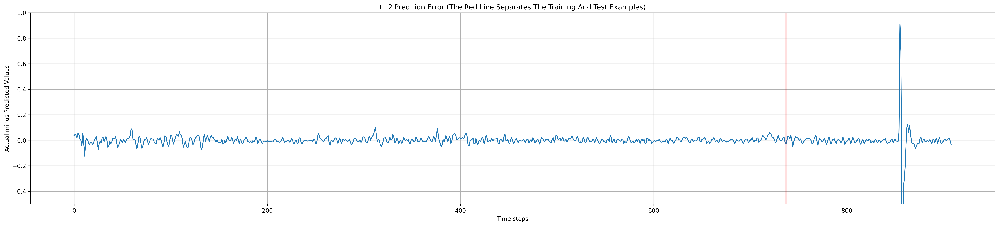

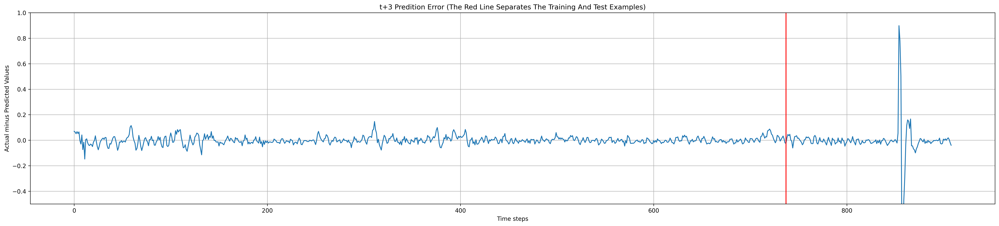

In [18]:
print ('***** LINEAR MODEL *****')
train_predict = linear_model.predict(X)
test_predict = linear_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

***** MLP MODEL *****
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 554us/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step


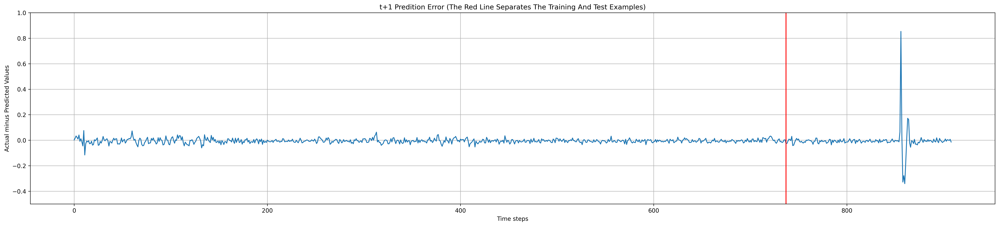

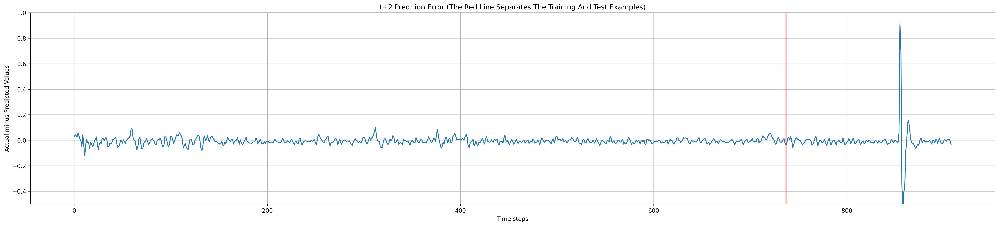

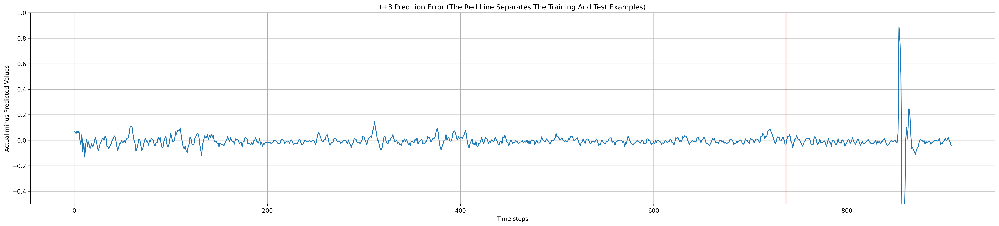

In [19]:
print ('***** MLP MODEL *****')
train_predict = MLP_model.predict(X)
test_predict = MLP_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

***** LSTM MODEL *****
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


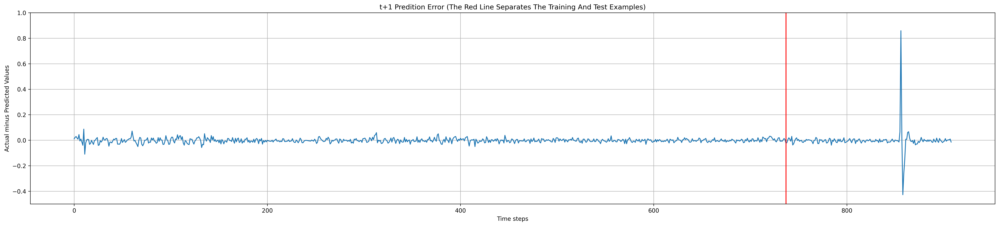

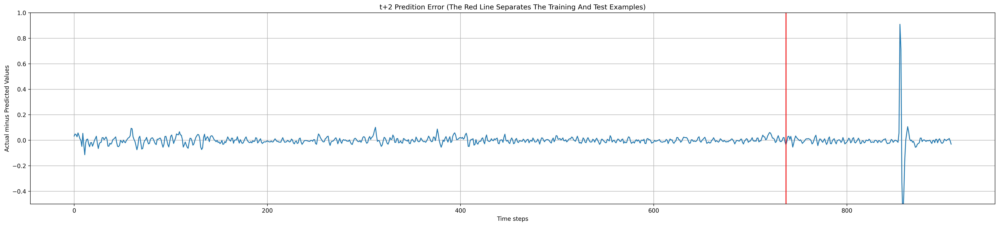

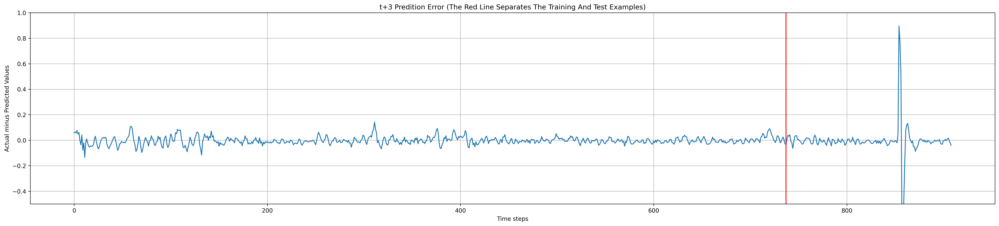

In [20]:
print ('***** LSTM MODEL *****')
train_predict = LSTM_model.predict(X)
test_predict = LSTM_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

## **Exhibit a dataframe with the final results for each predictor**

In [28]:
DF_results = pd.concat([df1, df2, df3, df4], axis=1, keys=['RNN', 'LINEAR', 'MLP', 'LSTM'])
# DF_results.index = ['t+1', 't+2', 't+3']
DF_results

RNN              LINEAR                 MLP                LSTM  \
      train      test     train      test     train      test     train   
0  0.031496  0.111459  0.029538  0.140618  0.030689  0.139155  0.029934   

             
       test  
0  0.135477

<font color="green">
Atividade (a) <br>
Explique o papel dos parâmetros de projeto [time_steps] e [horizon].
</font>

Resposta:


<font color="green">
Atividade (b) <br>
Qual a diferença no uso do parâmetro [time_steps] no caso dos preditores não-recorrentes e no caso do bloco LSTM?
</font>

Resposta:

<font color="green">
Atividade (c) <br>
Qual modelo de predição levou a um melhor desempenho junto aos dados de teste em cada caso?
</font>

Resposta: